In [1]:
import os              
os.environ['PYTHONHASHSEED'] = '0'
import desc          
import pandas as pd                                                    
import numpy as np                                                     
import scanpy as sc                                                                                 
from time import time                                                       
import sys
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
sc.settings.set_figure_params(dpi=300)  
print(sys.version)
sc.logging.print_versions()
desc.__version__
import tensorflow as tf
tf.__version__

2024-01-06 16:09:01.478632: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-06 16:09:03.277721: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-06 16:09:08.131349: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


3.8.17 | packaged by conda-forge | (default, Jun 16 2023, 07:06:00) 
[GCC 11.4.0]
-----
anndata     0.9.2
scanpy      1.9.3
-----
PIL                                         10.0.0
absl                                        NA
asttokens                                   NA
astunparse                                  1.6.3
backcall                                    0.2.0
certifi                                     2023.07.22
charset_normalizer                          3.2.0
comm                                        0.1.4
cycler                                      0.10.0
cython_runtime                              NA
dab0eaeee8bfae79490a0d4f23f5ad820bb199d8    NA
dateutil                                    2.8.2
debugpy                                     1.6.7
decorator                                   5.1.1
desc                                        2.1.1
dot_parser                                  NA
executing                                   1.2.0
flatbuffers                 

'2.13.0'

In [2]:
desc_norm=sc.read_h5ad("/home/huggs/shiyi/SCST/RCTD/RCTD/predata/celltrek_kidney/mymodel/6_DE/sc_desc_anno_norm.h5ad")
desc_norm

AnnData object with n_obs × n_vars = 40712 × 27998
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'desc_0.8', 'celltype', 'subcelltype'
    var: 'features'
    obsm: 'X_Embeded_z0.2', 'X_Embeded_z0.4', 'X_Embeded_z0.6', 'X_Embeded_z0.8', 'X_Embeded_z1.4', 'X_Embeded_z2.0', 'X_tsne', 'X_tsne0.2', 'X_tsne0.4', 'X_tsne0.6', 'X_tsne0.8', 'X_tsne1.4', 'X_tsne2.0', 'X_umap', 'X_umap0.2', 'X_umap0.4', 'X_umap0.6', 'X_umap0.8', 'X_umap1.4', 'X_umap2.0'

In [3]:
newstt=sc.read_h5ad("/home/huggs/shiyi/SCST/RCTD/RCTD/predata/celltrek_kidney/mymodel/5_newloaddesc/plot_st_newmnn.h5ad")
newstt

/home/huggs/anaconda3/envs/sy_DESC/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 1437 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'sc_celltype'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'sc_celltype_colors', 'spatial'
    obsm: 'spatial'

In [4]:
#rename sc_celltype


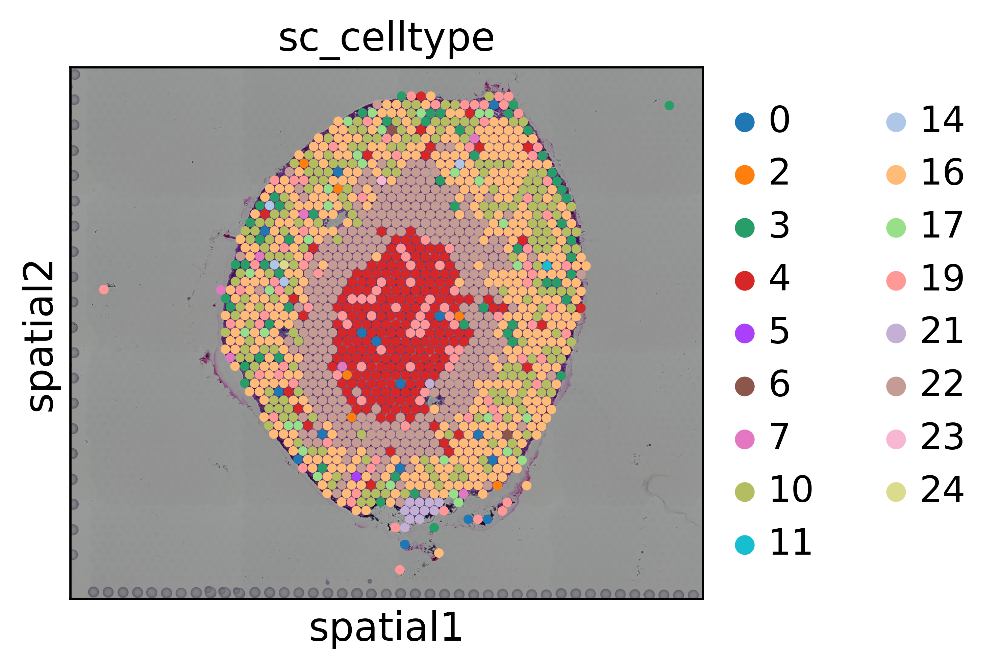

In [5]:
sc.pl.spatial(newstt, img_key="hires", color="sc_celltype", size=1.5)

In [6]:
desc_norm.obs['celltype']

Z1_F_F1_AAACCTGAGAGACGAA    2
Z1_F_F1_AAACCTGAGGGCTTCC    2
Z1_F_F1_AAACCTGCAGGACGTA    0
Z1_F_F1_AAACCTGGTATTCGTG    0
Z1_F_F1_AAACCTGTCAAACCAC    0
                           ..
Z3_M_M2_TTTGTCAAGTGGTCCC    2
Z3_M_M2_TTTGTCACATCACAAC    0
Z3_M_M2_TTTGTCACATCGTCGG    3
Z3_M_M2_TTTGTCAGTAACGACG    1
Z3_M_M2_TTTGTCATCTCAAGTG    0
Name: celltype, Length: 40712, dtype: int32

In [7]:
newstt.obs['sc_celltype']

AAACCGTTCGTCCAGG-1    10
AAACCTAAGCAGCCGG-1    16
AAACGAGACGGTTGAT-1    22
AAACGGTTGCGAACTG-1    10
AAACTCGGTTCGCAAT-1    16
                      ..
TTGTGTATGCCACCAA-1     4
TTGTGTTTCCCGAAAG-1     4
TTGTTCAGTGTGCTAC-1    10
TTGTTGTGTGTCAAGA-1    16
TTGTTTCACATCCAGG-1    10
Name: sc_celltype, Length: 1437, dtype: category
Categories (17, object): ['0', '2', '3', '4', ..., '21', '22', '23', '24']

In [8]:
len(["Vascular_1","Vascular_2","PT_1","DT_1","Principal_1","PT_2","Vascular_3","DT_2","tl-LoH_1","Intercalated","PT_3","PT_4","unknown","Principal_3","PT_5","NK_myeloid_2","Vascular_4"])


17

In [9]:
newstt.obs['subcelltype']=newstt.obs['sc_celltype'].cat.rename_categories(["Vascular_1","Vascular_2","PT_1","DT_1","Principal_1","PT_2","Vascular_3","DT_2","tl-LoH_1","Intercalated","PT_3","PT_4","unknown","Principal_3","PT_5","NK_myeloid_2","Vascular_4"])

In [10]:
pd.DataFrame(newstt.obs['subcelltype'])

,subcelltype
AAACCGTTCGTCCAGG-1,DT_2
AAACCTAAGCAGCCGG-1,PT_3
AAACGAGACGGTTGAT-1,PT_5
AAACGGTTGCGAACTG-1,DT_2
AAACTCGGTTCGCAAT-1,PT_3
...,...
TTGTGTATGCCACCAA-1,DT_1
TTGTGTTTCCCGAAAG-1,DT_1
TTGTTCAGTGTGCTAC-1,DT_2
TTGTTGTGTGTCAAGA-1,PT_3


In [11]:
newstt.obs['subcelltype1']=newstt.obs['subcelltype'].to_numpy()

In [12]:
newstt.obs['subcelltype1']

AAACCGTTCGTCCAGG-1    DT_2
AAACCTAAGCAGCCGG-1    PT_3
AAACGAGACGGTTGAT-1    PT_5
AAACGGTTGCGAACTG-1    DT_2
AAACTCGGTTCGCAAT-1    PT_3
                      ... 
TTGTGTATGCCACCAA-1    DT_1
TTGTGTTTCCCGAAAG-1    DT_1
TTGTTCAGTGTGCTAC-1    DT_2
TTGTTGTGTGTCAAGA-1    PT_3
TTGTTTCACATCCAGG-1    DT_2
Name: subcelltype1, Length: 1437, dtype: object

In [36]:
newstt

AnnData object with n_obs × n_vars = 1437 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'sc_celltype', 'subcelltype', 'subcelltype1'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'sc_celltype_colors', 'spatial', 'subcelltype_colors'
    obsm: 'spatial'

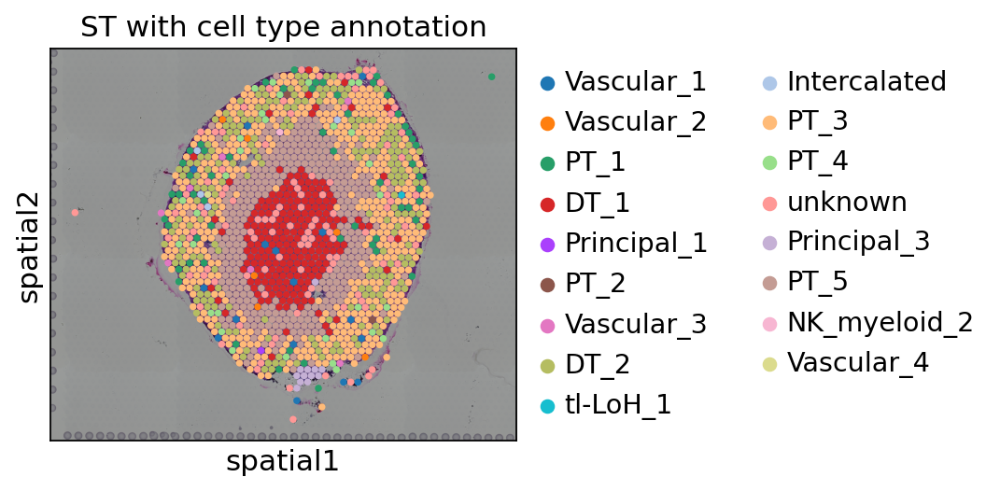

In [13]:
sc.set_figure_params(dpi_save=300)
sc.pl.spatial(newstt, img_key="hires", color="subcelltype", size=1.5,title="ST with cell type annotation",
            save="subcelltype.png",return_fig ="True"
        #,title_legend_color='dark'
              )

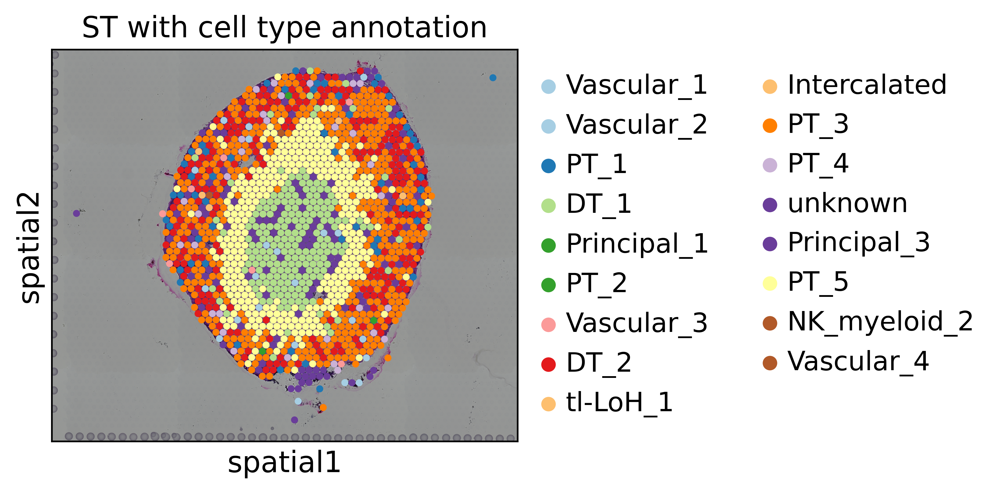

In [48]:
sc.pl.spatial(newstt, img_key="hires", color="subcelltype", size=1.5,title="ST with cell type annotation",
              palette ="Paired",save="subcelltype.png",return_fig ="True"
        #,title_legend_color='dark'
              )

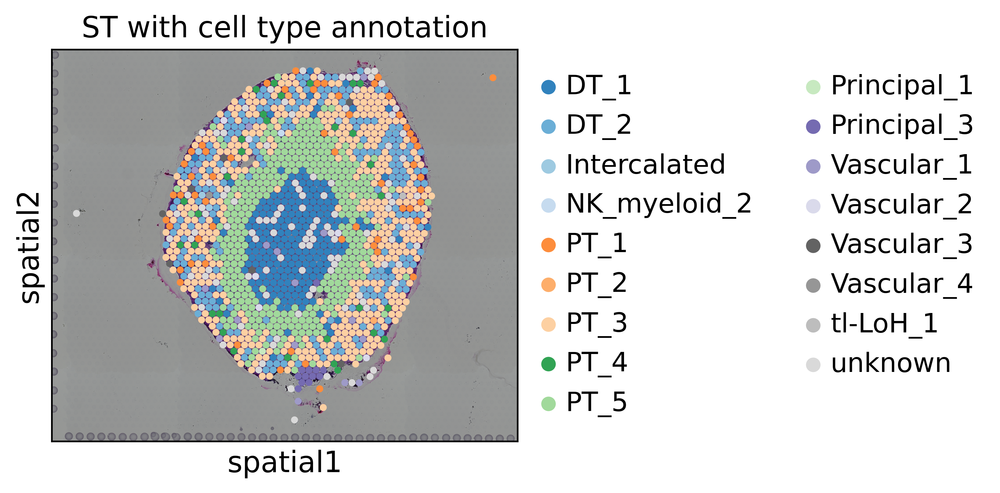

In [38]:
#坐标轴(axis)、坐标轴名称(axis label)、坐标轴刻度(tick)、坐标轴刻度标签(tick label)、网格线(grid)、图例(legend)、标题(title)
sc.pl.spatial(newstt, img_key="hires", color="subcelltype1", size=1.5,title="ST with cell type annotation",
              palette ="tab20c",save=".png",return_fig ="True"
        #,title_legend_color='dark'
              )

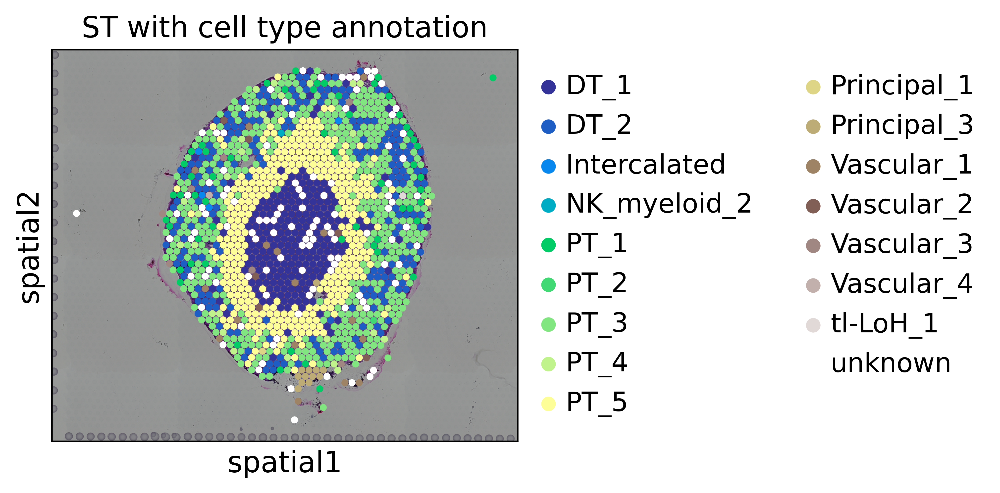

In [46]:
sc.pl.spatial(newstt, img_key="hires", color="subcelltype1", size=1.5,title="ST with cell type annotation",
              palette ="terrain",save=".png",return_fig ="True"
        #,title_legend_color='dark'
              )

In [15]:
newstt.write_h5ad("st_plot.h5ad")

In [ ]:
################################

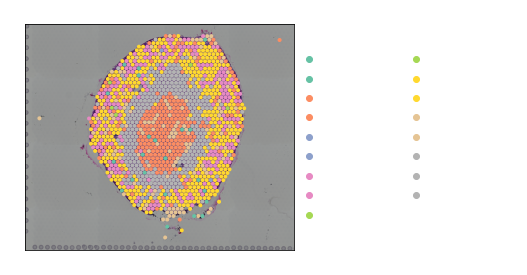

<Figure size 432x288 with 0 Axes>

In [58]:
import scanpy as sc
import matplotlib.pyplot as plt
%matplotlib inline 

# 你的数据加载和分析步骤
adata = newstt

# 使用 sc.pl.spatial 函数来绘制空间图
sc.pl.spatial(newstt, img_key="hires", color="subcelltype", size=1.5,title="ST with cell type annotation",
              palette ="Set2",return_fig ="True"
              )
# 获取 Matplotlib 的当前图形对象
fig = plt.gcf()
fig.patch.set_facecolor('white')

# 保存图形为 PDF 文件
fig.savefig('spatial_map.pdf', format='pdf')

# 显示图形（可选）
plt.show()


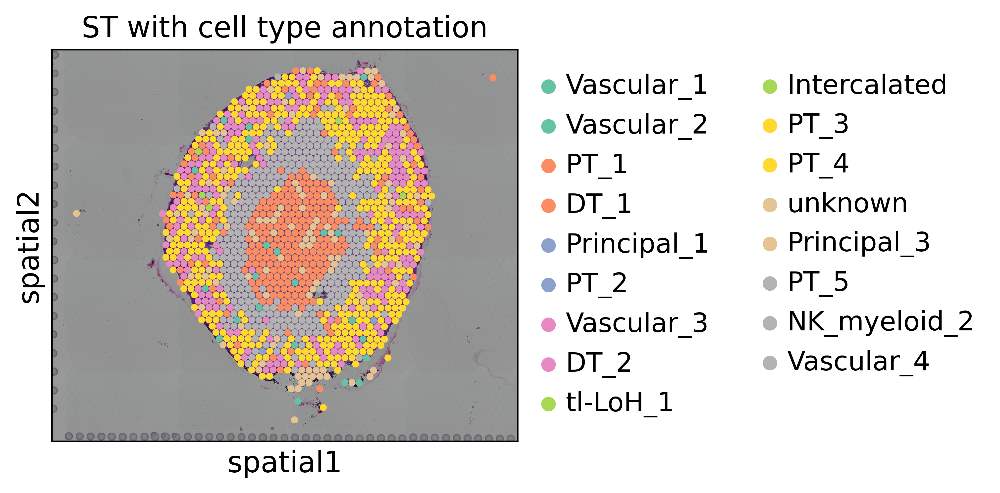

AttributeError: 'Axes' object has no attribute 'get_texts'

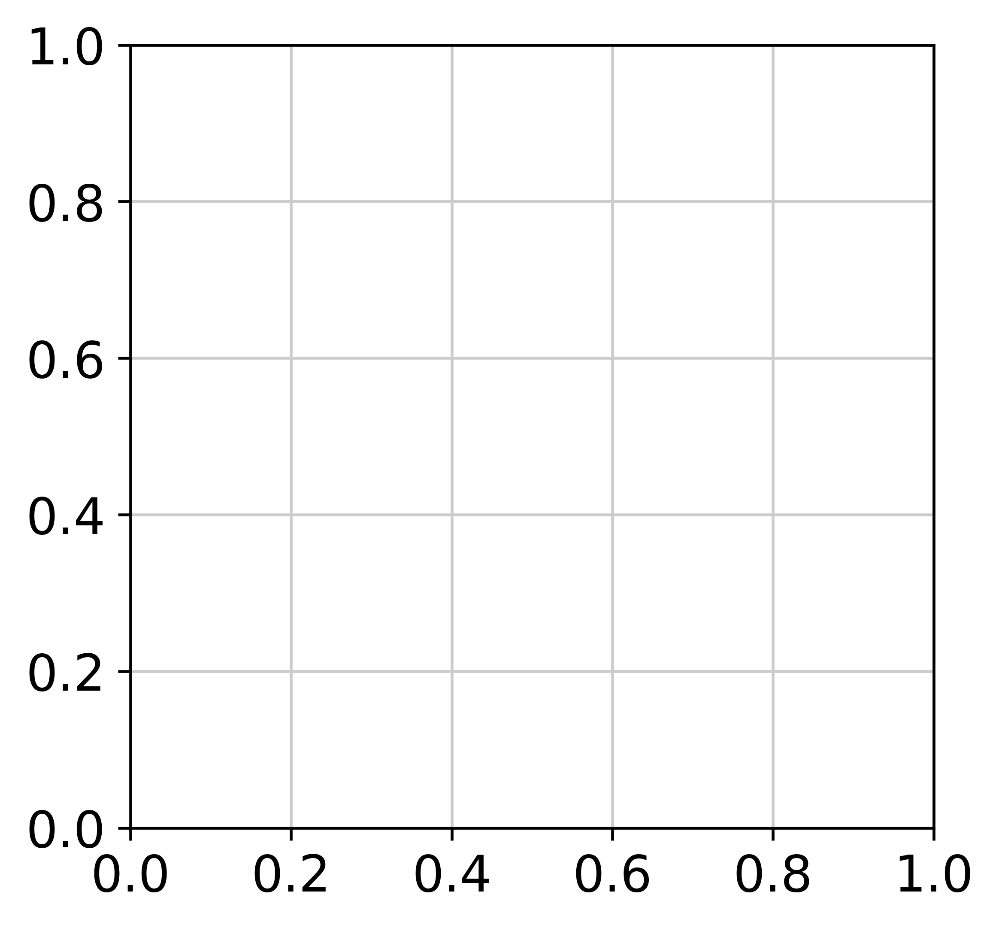

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt

%matplotlib inline 

sc.pl.spatial(newstt, img_key="hires", color="subcelltype", size=1.5,title="ST with cell type annotation",
              palette ="Set2",return_fig ="True"#,title_legend_color='dark'
              )
# 获取图例对象
fig = plt.gcf()
legend = fig.gca()#.get_legend()

#l = legend()
for text in legend.get_texts():
    text.set_color("red")
# 保存图形为 PDF 文件
fig.savefig('spatial_map.pdf', format='pdf')

# 显示图形（可选）
plt.show()



In [ ]:
font = {'family' : 'serif',
        'color'  : 'darkred',
        'weight' : 'normal',
        'size'   : 16,
        }
# 设置图例的边框颜色
if legend:
    for item in legend.get_lines():
        item.set_label('colorbar',fontdict=font)